# GE Bracket

Geometry from the GE jet engine bracket challenge: https://grabcad.com/challenges/ge-jet-engine-bracket-challenge

Load cases considered in the optimization: 35.6 kN vertical force / 37.8 kN horizontal force

For numerical reasons, the force was rescaled by a factor of 0.01. Therefore, to obtain the actual compliance it is necessary to multiply the output by 10000 and to obtain the actual displament it is necessary to multiply the output by 100.

Ansys model:
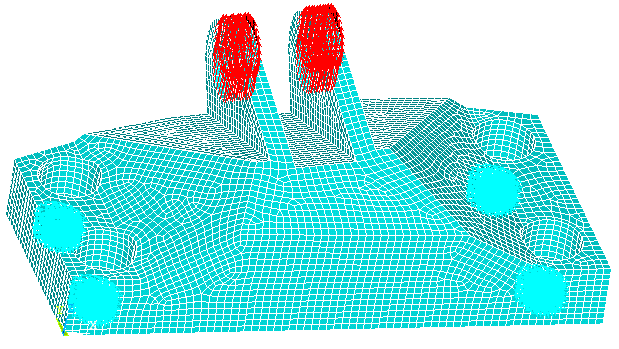

In [1]:
import os, sys
path = os.path.abspath(os.path.join('..'))
os.chdir(path)
if path not in sys.path:
    sys.path.append(path)

In [2]:
import matplotlib.pyplot as plt
import niceplots
plt.style.use(niceplots.get_style())

import pyvista as pv
pv.set_plot_theme('document')
pv.set_jupyter_backend('static')

import numpy as np
from optim import TopOpt, Post3D

In [ ]:
# {t/mm^3, MPa, -, kgCO2/kg}
flax = {'rho': 1470e-12, 'E': 53.5e3,  'v': 0.355, 'CO2': 0.44}
pla  = {'rho': 1290e-12, 'E': 3.45e3, 'v': 0.39,  'CO2': 2.28}
Vfiber  = 0.5

Ex, Ey, nuxy, nuyz, Gxy, rho, CO2mat = TopOpt.rule_mixtures(fiber=flax, matrix=pla, Vfiber=Vfiber)
CO2veh = 1030 * 25 * 3.83 # kg_fuel/kg_transported/year * years * kgCO2/kg_fuel = kgCO2/kg

In [ ]:
solver1 = TopOpt(inputfile='models/bracket.db', load_cases=('models/bracket_ver.s01', 'models/bracket_hor.s01'), res_dir='results/workflow/pre_direction/z/',
        dim='3D_layer', jobname='z')
solver1.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver1.set_volfrac(0.2)
solver1.set_filters(r_rho=5, r_theta=7)
solver1.set_print_direction(print_direction=(0.,0.,1.))
solver1.set_initial_conditions('random')
solver1.set_optim_options(max_iter=50, tol=5e-3, continuation=True)

region1 = np.where((solver1.centers[:,0]-15.5)**2 + (solver1.centers[:,1]-13.5)**2 < 8**2)[0]
region2 = np.where((solver1.centers[:,0]-15.2)**2 + (solver1.centers[:,1]-51.8)**2 < 8**2)[0]
region3 = np.where((solver1.centers[:,0]-163.2)**2 + (solver1.centers[:,1]-47.3)**2 < 8**2)[0]
region4 = np.where((solver1.centers[:,0]-163.2)**2 + (solver1.centers[:,1]+4.9)**2 < 8**2)[0]
region5 = np.where((solver1.centers[:,1]-73)**2 + (solver1.centers[:,2]-40.5)**2 < 15**2)[0]
solid = np.concatenate([region1, region2, region3, region4, region5])
solver1.set_solid_elem(solid)

solver1.run()
solver1.save()

solver1.print_timing()

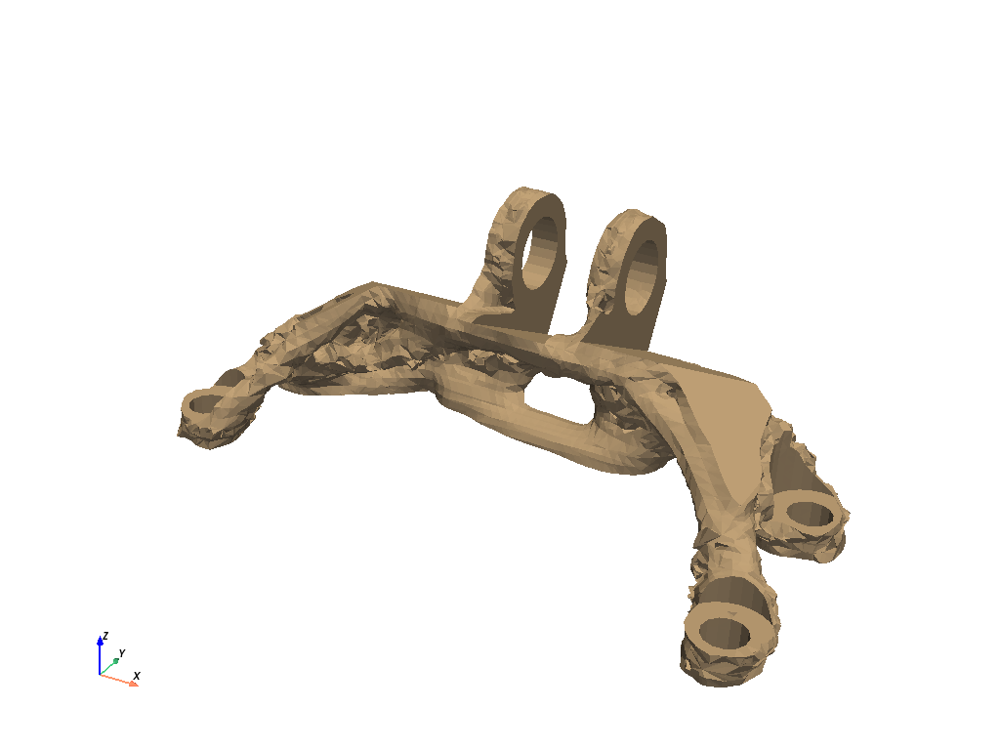

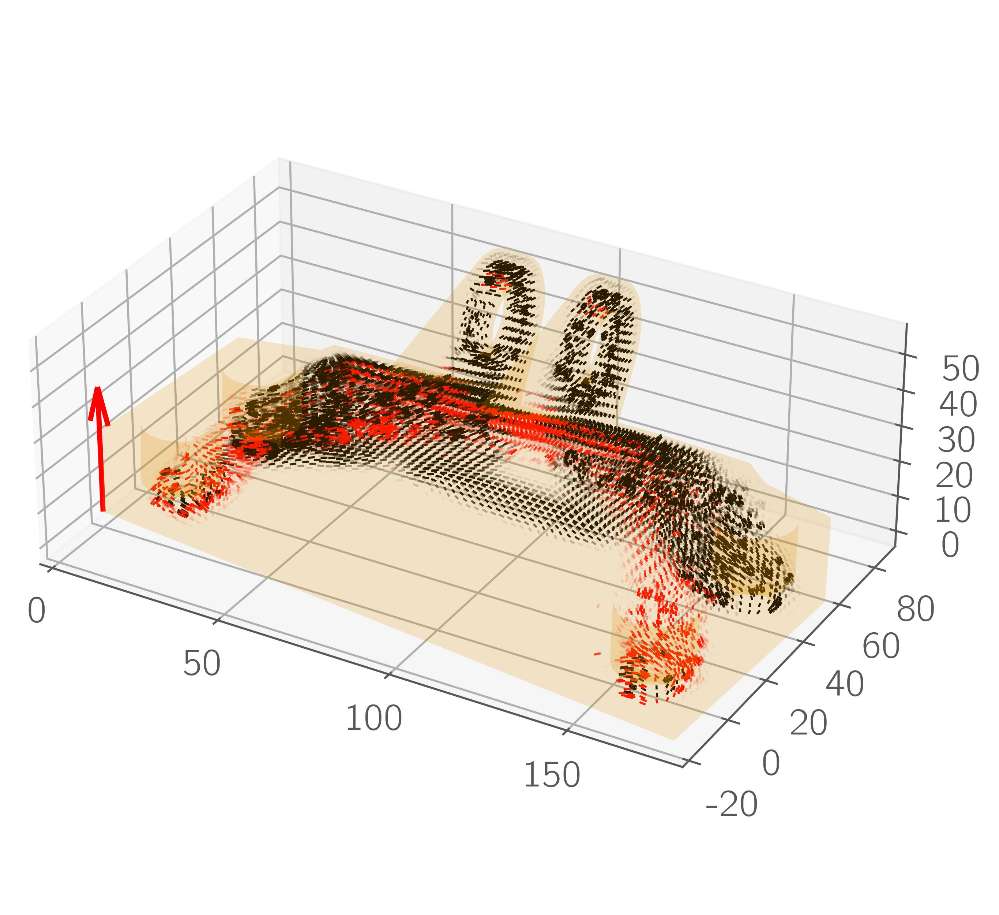

In [4]:
solver1 = TopOpt.load('results/workflow/pre_direction/z/topopt.json')
post1 = Post3D(solver1)
post1.plot(domain_stl='models/bracket.stl', printability=True)
post1.plot_iso(threshold=0.55)
# post1.plot_fibers(layer=np.linspace(0,len(solver1.layers)-1,4).astype(int), domain_stl='models/bracket.stl')

In [ ]:
solver2 = TopOpt(inputfile='models/bracket.db', load_cases=('models/bracket_ver.s01', 'models/bracket_hor.s01'), res_dir='results/workflow/pre_direction/y/',
        dim='3D_layer', jobname='y')
solver2.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver2.set_volfrac(0.2)
solver2.set_filters(r_rho=5, r_theta=7)
solver2.set_print_direction(print_direction=(0.,1.,0.))
solver2.set_initial_conditions('random')
solver2.set_optim_options(max_iter=50, tol=5e-3, continuation=True)

region1 = np.where((solver2.centers[:,0]-15.5)**2 + (solver2.centers[:,1]-13.5)**2 < 8**2)[0]
region2 = np.where((solver2.centers[:,0]-15.2)**2 + (solver2.centers[:,1]-51.8)**2 < 8**2)[0]
region3 = np.where((solver2.centers[:,0]-163.2)**2 + (solver2.centers[:,1]-47.3)**2 < 8**2)[0]
region4 = np.where((solver2.centers[:,0]-163.2)**2 + (solver2.centers[:,1]+4.9)**2 < 8**2)[0]
region5 = np.where((solver2.centers[:,1]-73)**2 + (solver2.centers[:,2]-40.5)**2 < 15**2)[0]
solid = np.concatenate([region1, region2, region3, region4, region5])
solver2.set_solid_elem(solid)

solver2.run()
solver2.save()

solver2.print_timing()

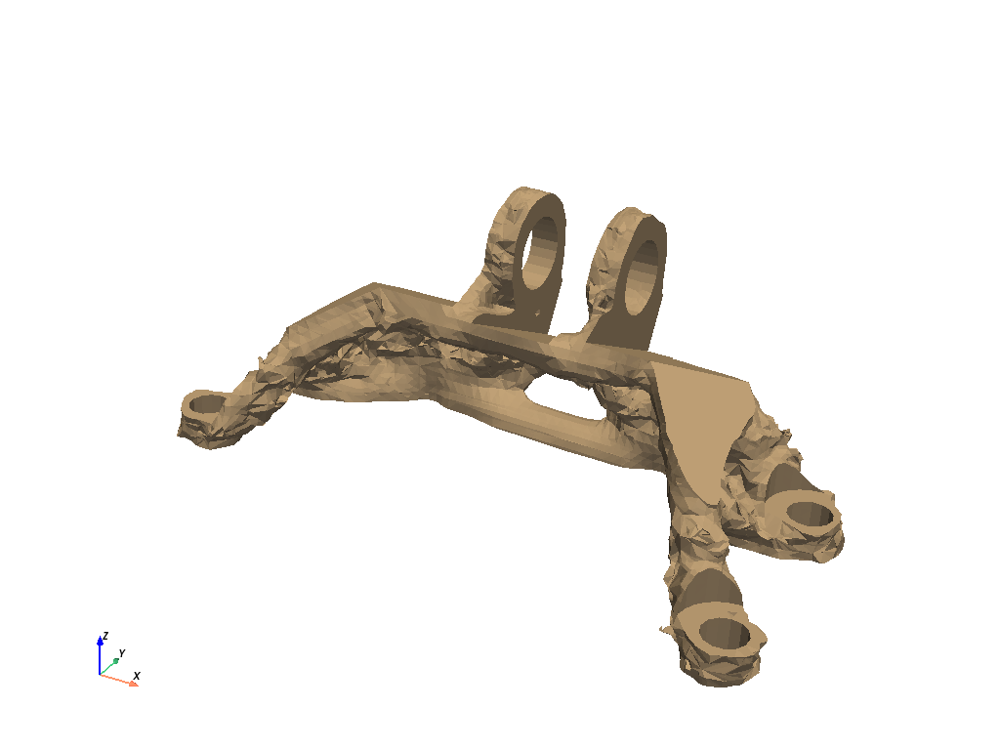

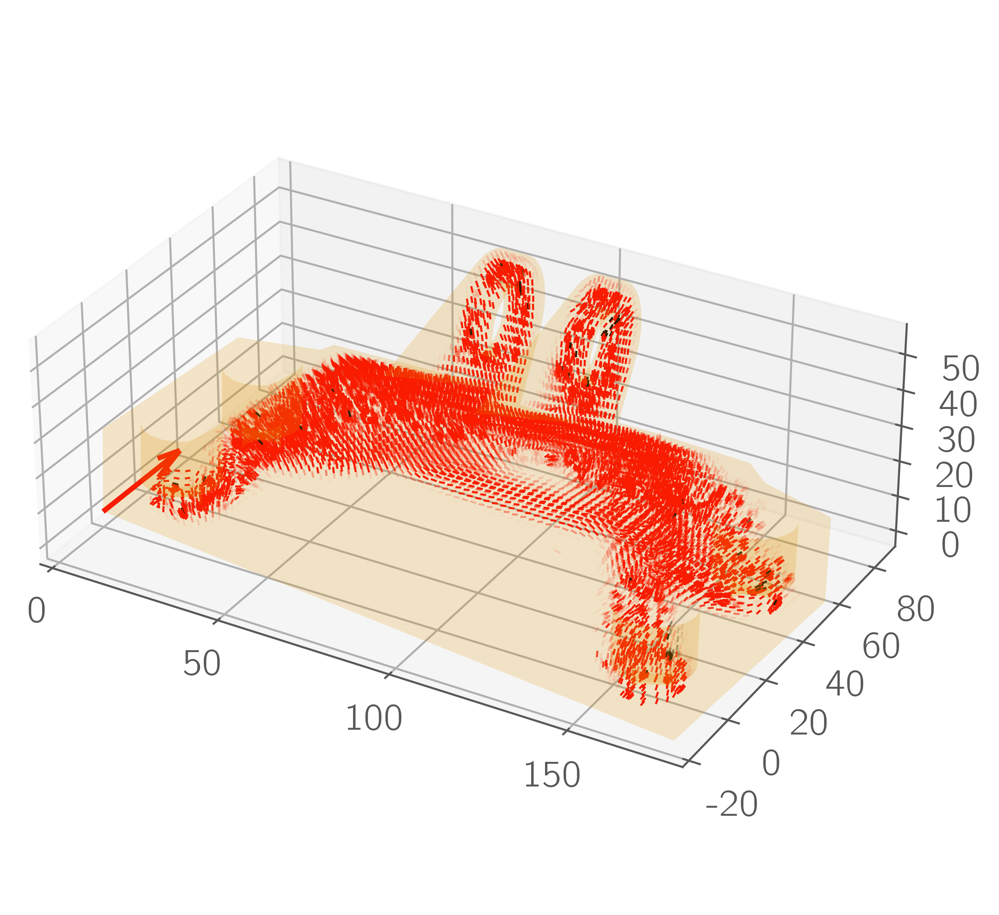

In [5]:
solver2 = TopOpt.load('results/workflow/pre_direction/y/topopt.json')
post2 = Post3D(solver2)
post2.plot(domain_stl='models/bracket.stl', printability=True)
post2.plot_iso(threshold=0.55)
# post2.plot_fibers(layer=np.linspace(0,len(solver2.layers)-1,4).astype(int), domain_stl='models/bracket.stl')

In [ ]:
solver3 = TopOpt(inputfile='models/bracket.db', load_cases=('models/bracket_ver.s01', 'models/bracket_hor.s01'), res_dir='results/workflow/pre_direction/x/',
        dim='3D_layer', jobname='x')
solver3.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver3.set_volfrac(0.2)
solver3.set_filters(r_rho=5, r_theta=7)
solver3.set_print_direction(print_direction=(1.,0.,0.))
solver3.set_initial_conditions('random')
solver3.set_optim_options(max_iter=50, tol=5e-3, continuation=True)

region1 = np.where((solver3.centers[:,0]-15.5)**2 + (solver3.centers[:,1]-13.5)**2 < 8**2)[0]
region2 = np.where((solver3.centers[:,0]-15.2)**2 + (solver3.centers[:,1]-51.8)**2 < 8**2)[0]
region3 = np.where((solver3.centers[:,0]-163.2)**2 + (solver3.centers[:,1]-47.3)**2 < 8**2)[0]
region4 = np.where((solver3.centers[:,0]-163.2)**2 + (solver3.centers[:,1]+4.9)**2 < 8**2)[0]
region5 = np.where((solver3.centers[:,1]-73)**2 + (solver3.centers[:,2]-40.5)**2 < 15**2)[0]
solid = np.concatenate([region1, region2, region3, region4, region5])
solver3.set_solid_elem(solid)

solver3.run()
solver3.save()

solver3.print_timing()

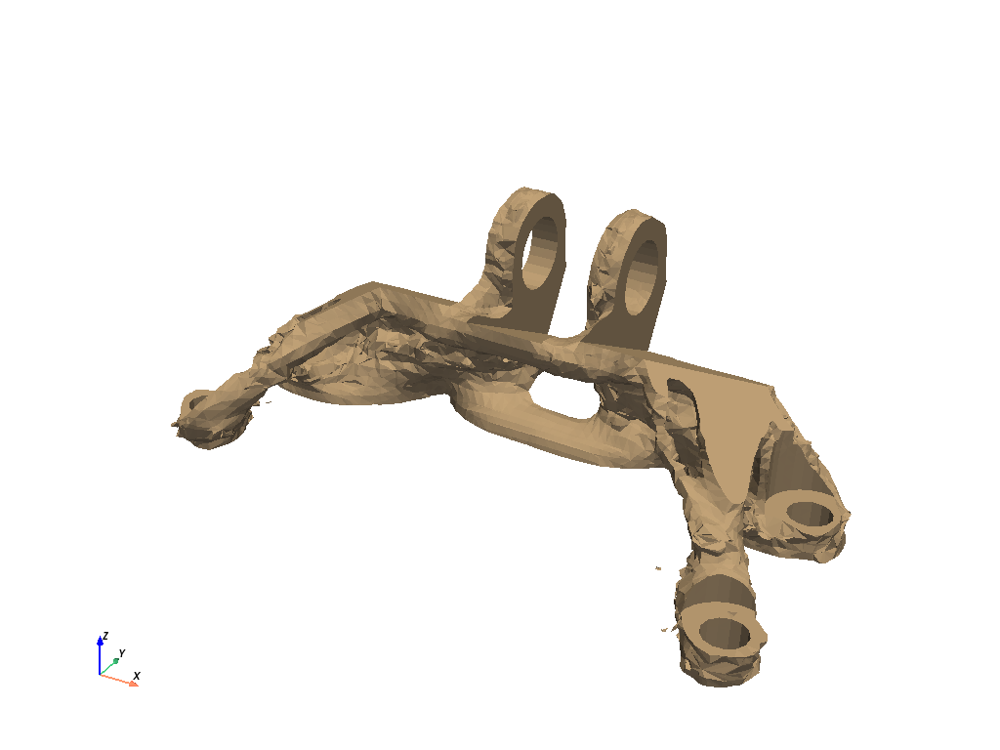

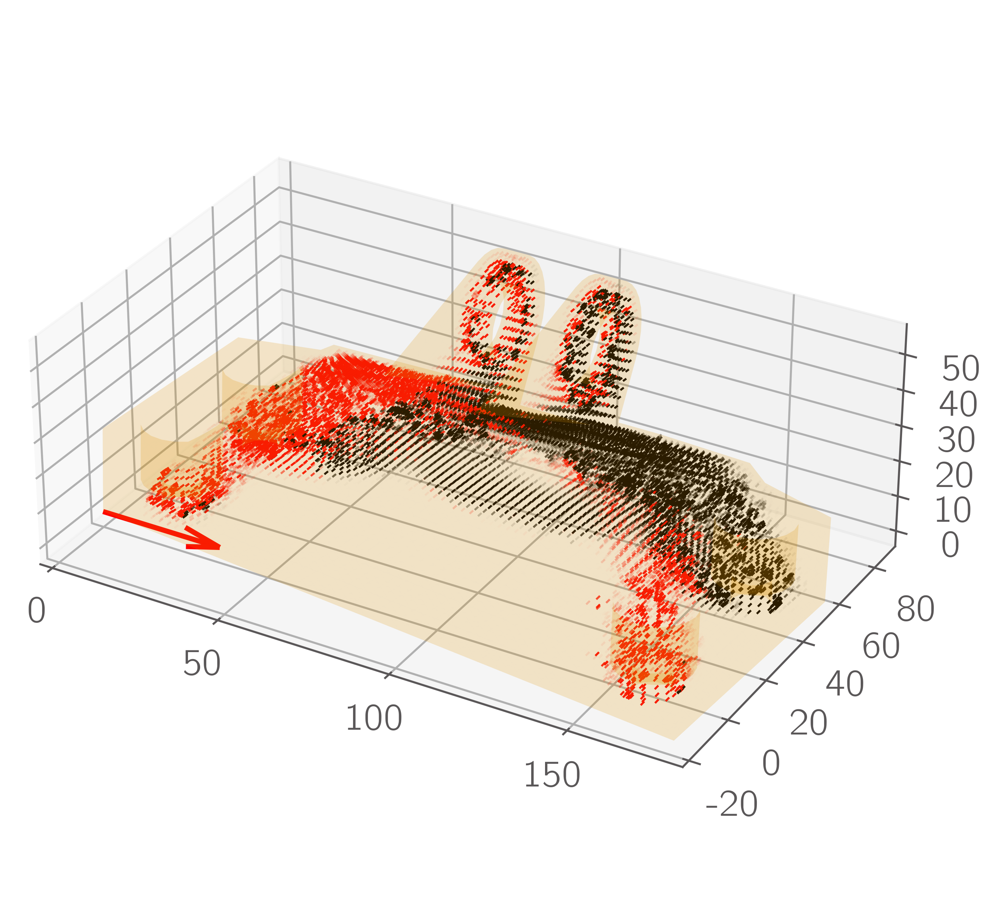

In [6]:
solver3 = TopOpt.load('results/workflow/pre_direction/x/topopt.json')
post3 = Post3D(solver3)
post3.plot(domain_stl='models/bracket.stl', printability=True)
post3.plot_iso(threshold=0.55)
# post3.plot_fibers(layer=np.linspace(0,len(solver3.layers)-1,4).astype(int), domain_stl='models/bracket.stl')

In [ ]:
solver4 = TopOpt(inputfile='models/bracket.db', load_cases=('models/bracket_ver.s01', 'models/bracket_hor.s01'), res_dir='results/workflow/pre_direction/free/',
        dim='3D_free', jobname='free')
solver4.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver4.set_volfrac(0.2)
solver4.set_filters(r_rho=5, r_theta=7)
solver4.set_initial_conditions('random')
solver4.set_optim_options(max_iter=50, tol=5e-3, continuation=True)

region1 = np.where((solver4.centers[:,0]-15.5)**2 + (solver4.centers[:,1]-13.5)**2 < 8**2)[0]
region2 = np.where((solver4.centers[:,0]-15.2)**2 + (solver4.centers[:,1]-51.8)**2 < 8**2)[0]
region3 = np.where((solver4.centers[:,0]-163.2)**2 + (solver4.centers[:,1]-47.3)**2 < 8**2)[0]
region4 = np.where((solver4.centers[:,0]-163.2)**2 + (solver4.centers[:,1]+4.9)**2 < 8**2)[0]
region5 = np.where((solver4.centers[:,1]-73)**2 + (solver4.centers[:,2]-40.5)**2 < 15**2)[0]
solid = np.concatenate([region1, region2, region3, region4, region5])
solver4.set_solid_elem(solid)

solver4.run()
solver4.save()

solver4.print_timing()

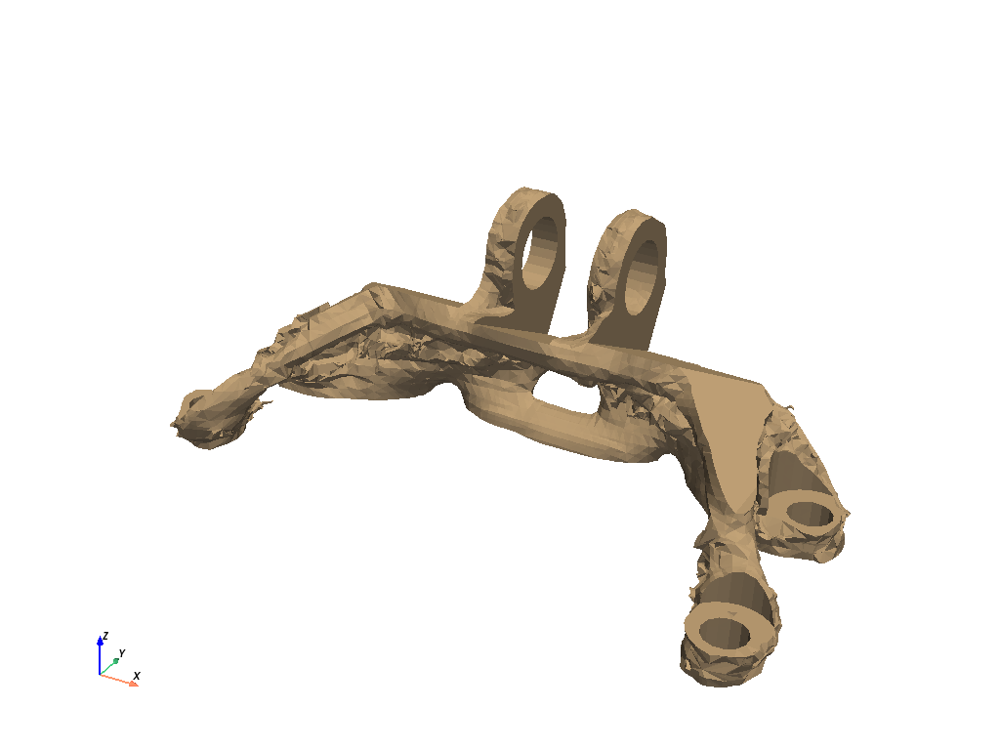

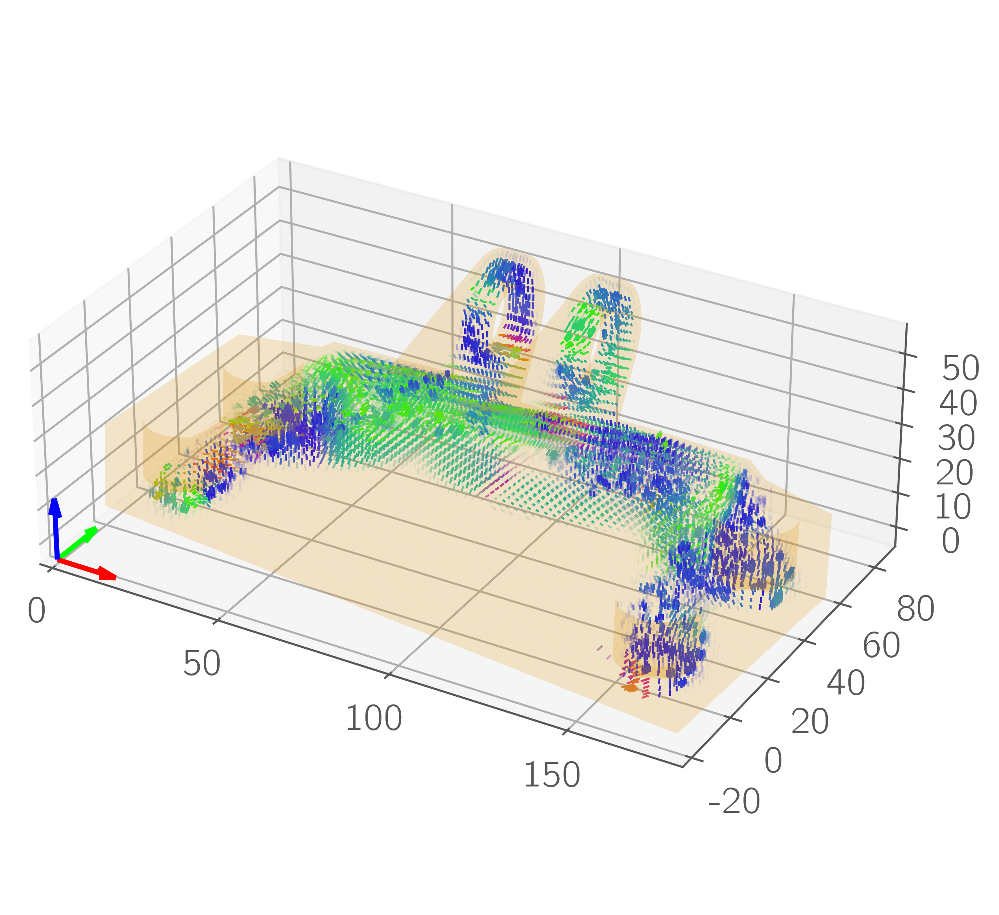

In [7]:
solver4 = TopOpt.load('results/workflow/pre_direction/free/topopt.json')
post4 = Post3D(solver4)
post4.plot(domain_stl='models/bracket.stl')
post4.plot_iso(threshold=0.55)

In [8]:
print('-'*(21*7+1))
print(('|{:^20}'*7+'|').format('','C (N.mm)', 'c1 (N.mm)', 'c2 (N.mm)', 'Printability (%)','Iter','Time (s)'))
print('-'*(21*7+1))
print(('|{:^20}|{:^20.3f}|{:^20.3f}|{:^20.3f}|{:^20}|{:^20}|{:^20.2f}|').format('Free',solver4.comp_norm_max_hist[-1],solver4.comp_norm_hist[0][-1],solver4.comp_norm_hist[1][-1],'--',solver4.mma.iter,solver4.time))
for s, name in zip([solver3, solver2, solver1],['x','y','z']):
    print(('|{:^20}|{:^20.3f}|{:^20.3f}|{:^20.3f}|{:^20.1f}|{:^20}|{:^20.2f}|').format(name,s.comp_norm_max_hist[-1],s.comp_norm_hist[0][-1],s.comp_norm_hist[1][-1],100*s.get_printability()[0],s.mma.iter,s.time))
print('-'*(21*7+1))

----------------------------------------------------------------------------------------------------------------------------------------------------
|                    |      C (N.mm)      |     c1 (N.mm)      |     c2 (N.mm)      |  Printability (%)  |        Iter        |      Time (s)      |
----------------------------------------------------------------------------------------------------------------------------------------------------
|        Free        |       33.859       |       32.987       |       27.481       |         --         |         40         |      3672.81       |
|         x          |       32.530       |       32.132       |       24.200       |        70.3        |         45         |      3710.61       |
|         y          |       26.381       |       25.710       |       21.384       |        18.8        |         37         |      3308.57       |
|         z          |       27.341       |       26.796       |       21.543       |        73.7        |